<a href="https://colab.research.google.com/github/WilliamShengYangHuang/AALU_Coding/blob/main/highway_alexander_manheim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **A Study on Alexander-Manheim Matrix**

Hypothesis: the project (Alexander and Manheim, 1962) can be explained with the perceptron (Rosenblatt, 1958) model.

\begin{equation} 
\sum ^{n}_{i=0}x_{i}w_{i}+b\geq 0,f\left( x\right) =1
\end{equation}


\begin{equation} 
\sum ^{n}_{i=0}x_{i}w_{i}+b <0,f\left( x\right) =0
\end{equation}


*x*: pixel values (brightness)

*w*: pixel weight in overlap

*b*: bias

"An experiment is described which uses diagrams for highway location selection. The method was specifically applied to the selection of a section of the interstate highway system, route 1-91, which is to run roughly north-south in an area in western massachusetts. A combination is used of the following diagrams for 26 requirements: earthwork costs, comfort and safety, regional development, local land development, obsolescence, interference during construction, user cost, services, travel time, pavement and subgrade costs, drainage patterns, bridge costs, land costs, eyesores, noise, air pollution, weather effects, non- recompensable public and private losses, public financial losses, major current traffic desires, catchment areas, local accessibility and integrity, future transportation systems, existing transportation systems, duplication of facilities, and self-induced congestion. Diagrams, or utility maps for each requirement are combined. By concentrating on the configurational, or pattern, properties of the highway as a path, the amalgamation of utilities is based on the specific details of individual choice situations. The requirements and the conflicts between pairs of requirements must be resolved. ***A computer program is used to analyze the set of requirements and the set of conflicts between requirements.*** The method is presented to combine the 26 utility diagrams defined over terrain points, to get the best path."

Alexander, C. & Manheim, M. L. 1962. The Use of Diagrams in Highway Route Location: An Experiment.

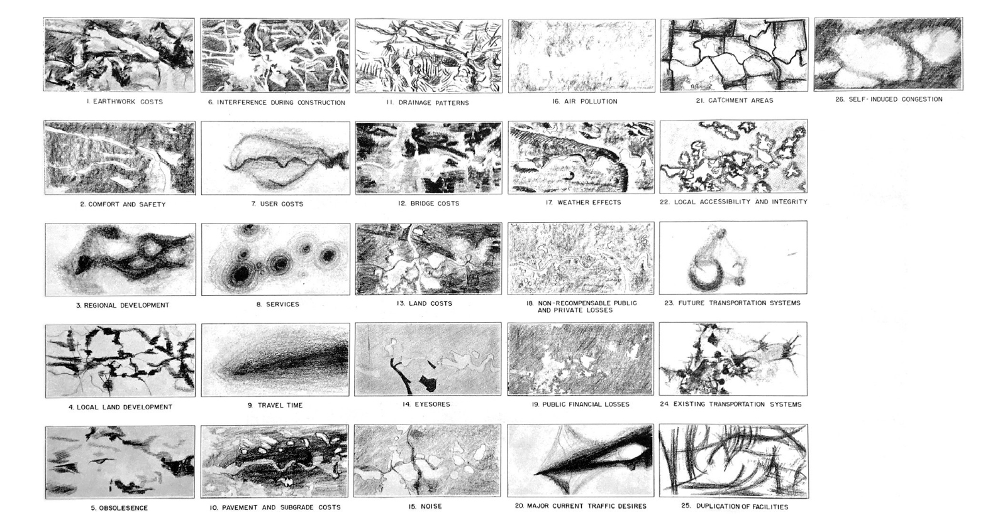

Diagram showing the overlay and path drawing process for requirements 6 (Interference During Construction), 17 (Weather Effects) and 24 (Existing Transportation Systems). ‘6+17+24’ shows the overlay image of the three requirements; ‘G’, at top, is the path diagram marking the darkest areas seen in the overlay image. Christopher Alexander and Marvin L. Manheim, The Use of Diagrams in Highway Route Location: An Experiment (Cambridge, MA: School of Engineering, Massachusetts Institute of Technology, 1962), 17. © Massachusetts Institute of Technology (1962). Reproduced with permission from the Massachusetts Institute of Technology

### Install necessary packages

In [60]:
import numpy as np
import pandas as pd
from math import copysign, log10

import skimage
from skimage import util
from skimage.io import imshow, imread
from skimage.feature import hog

import cv2 as cv
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from google.colab.patches import cv2_imshow 
from google.colab import drive

### Load image data

In [61]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [78]:
PATH = []
im = []
im_gray = []
for i in range(1, 6):
  PATH.append('/content/drive/My Drive/phd_thesis_data/alexander_manhein_matrix/h{}+.jpg'.format(i))
  im.append(imread(PATH[i-1], as_gray=True))
  im_gray.append(cv.imread(PATH[i-1], cv.IMREAD_GRAYSCALE))

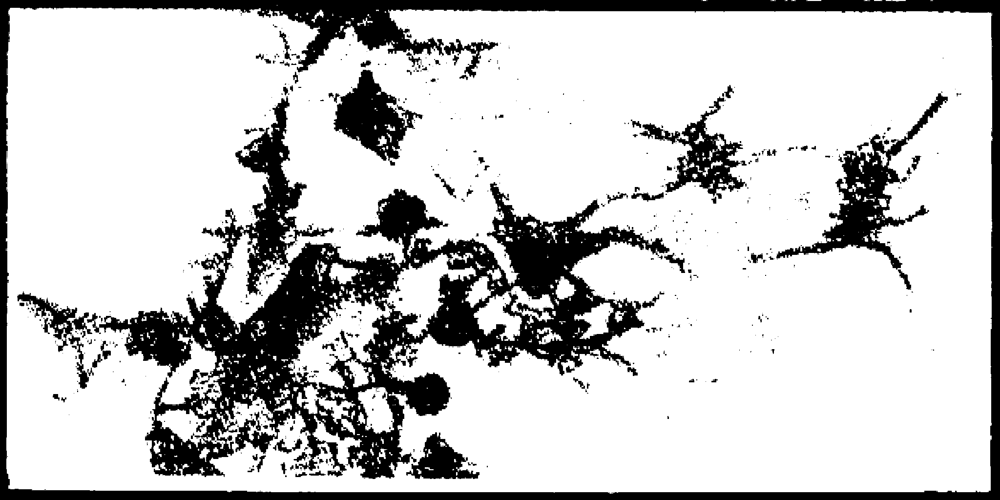

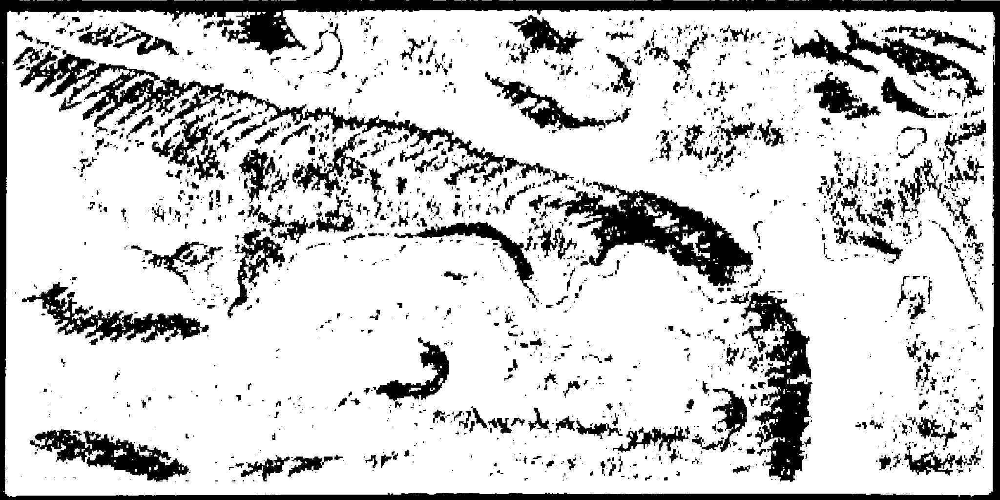

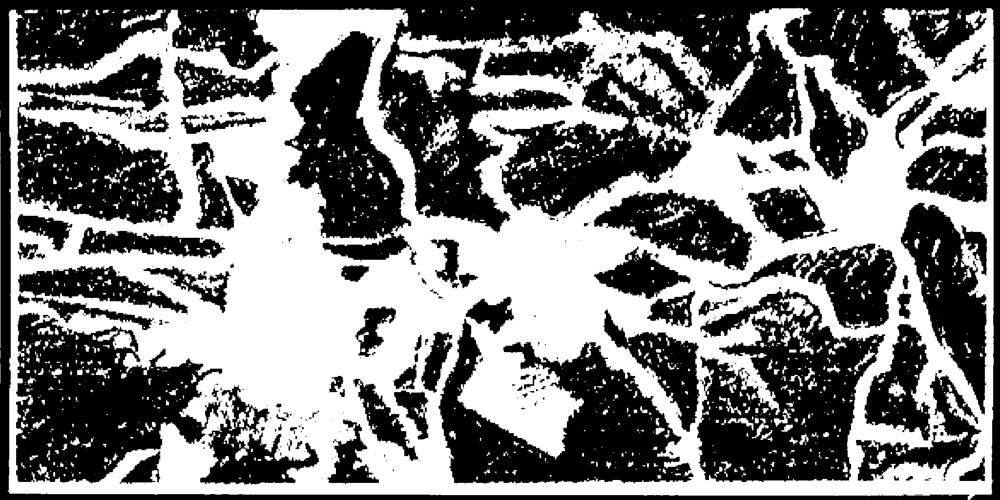

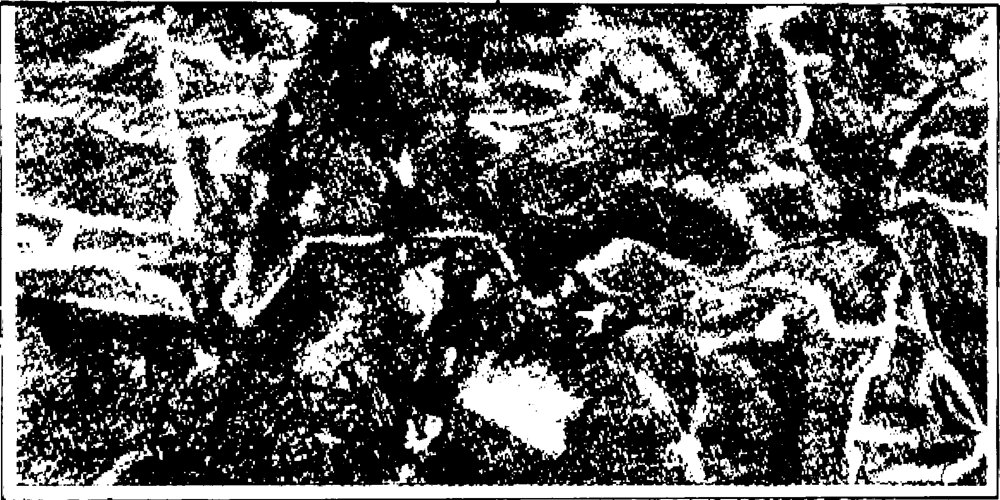

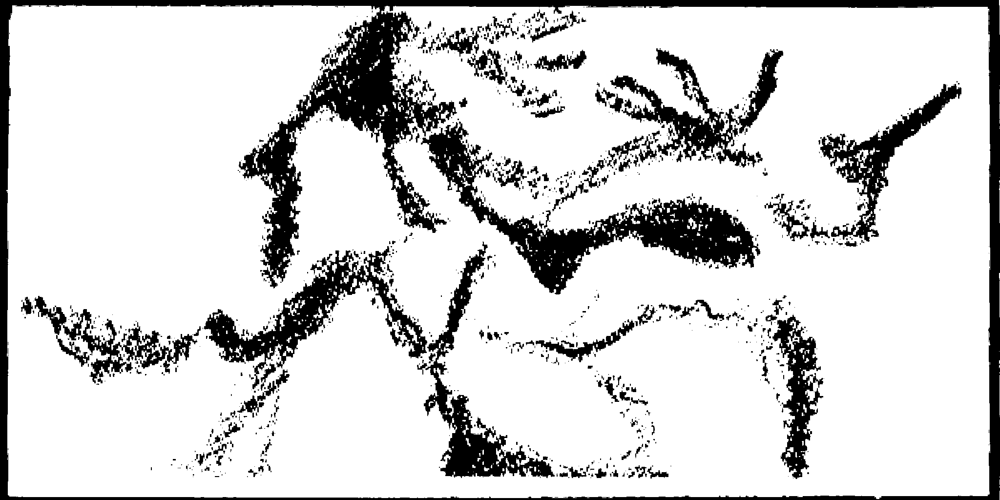

In [85]:
im_binarised = []

for i in range(5):
  _,im_gray[i] = cv.threshold(im_gray[i], 128, 255, cv.THRESH_BINARY)
  im_binarised.append(im_gray[i])
  cv2_imshow(im_binarised[i])

### Draw calibrated images

In [86]:
def draw_calibrated_images(im_id, subplot_id, title):  
  plt.subplot(3, 3, subplot_id)
  plt.axis('off')
  plt.title(title, fontsize=6)
  imshow(im[im_id])

In [87]:
def huMoment():

  # Calculate Moments 
  moments = cv.moments(im) 

  # Calculate Hu Moments 
  huMoments = cv.HuMoments(moments)

  # Log scale hu moments 
  for i in range(0, 7):
    huMoments[i] = -1* copysign(1.0, huMoments[i]) * log10(abs(huMoments[i]))
    print(huMoments[i])

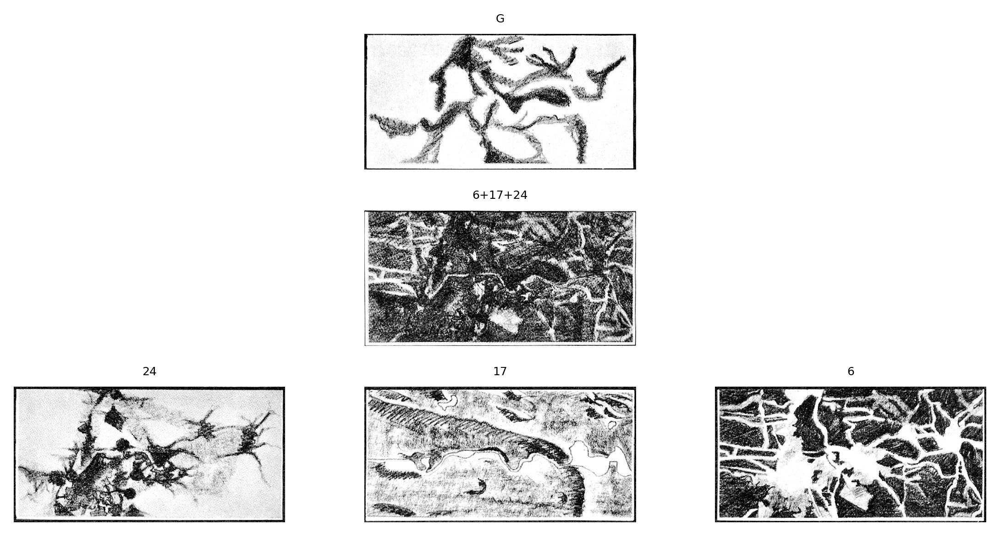

In [88]:
plt.figure(figsize=(8, 4), dpi=300)

# level 1
draw_calibrated_images(0, 7, '24') # requirement 24: Existing Transportation Systems
draw_calibrated_images(1, 8, '17') # requirement 17: Weather Effects
draw_calibrated_images(2, 9, '6') # requirement 6: Interference During Construction

# level 2
draw_calibrated_images(3, 5, '6+17+24') # overlap(6+17+24)

# level 3
draw_calibrated_images(4, 2, 'G') # image G

### Digital Overlap

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


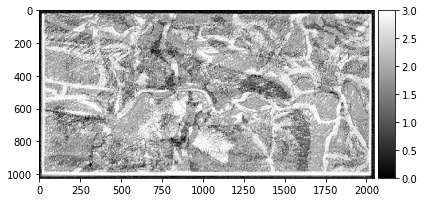

In [89]:
im_sum = im[0]+im[1]+im[2]
imshow(im_sum, cmap='gray')

### Parametric Filter

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


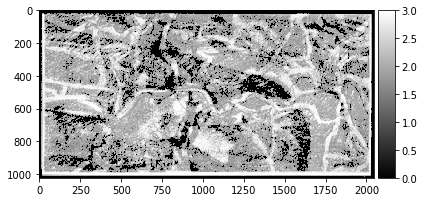

In [90]:
# Parametric Filter
mask = im_sum > 1.5
masked_image = im_sum * mask
imshow(masked_image, cmap='gray')

Comparison between Original Overlap and Digital Overlap

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


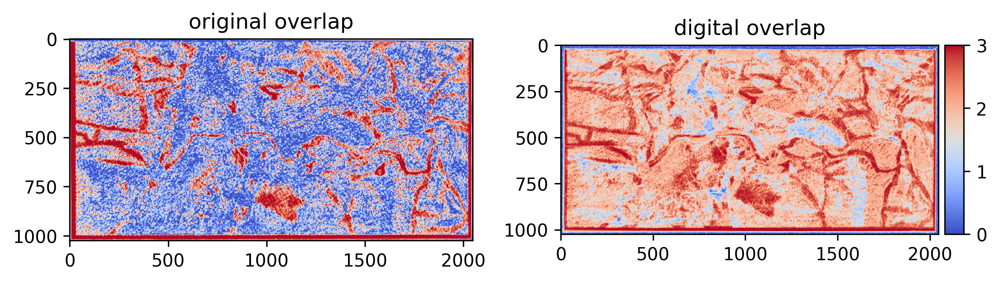

In [91]:
plt.figure(figsize=(8, 4), dpi=300)

cmap = 'coolwarm'

# w = human input (unknown)
plt.subplot(121)
plt.title('original overlap')
imshow(im[3], cmap=cmap)

# w = 1.0 (constant)
plt.subplot(122)
plt.title('digital overlap')
imshow(im_sum, cmap=cmap)

In [92]:
def plot_filtered_image(threshold, order):

  mask = im_sum < threshold
  masked_image = im_sum * mask
  inverted_img = util.invert(masked_image)

  plt.subplot(1, 10, order)
  plt.axis('off')
  plt.title(threshold)
  imshow(inverted_img, cmap='gray')

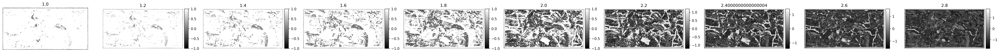

In [93]:
plt.figure(figsize=(40, 4), dpi=300)
for i in range (10):
  threshold = (i*0.2 + 1)
  plot_filtered_image(threshold, i+1)

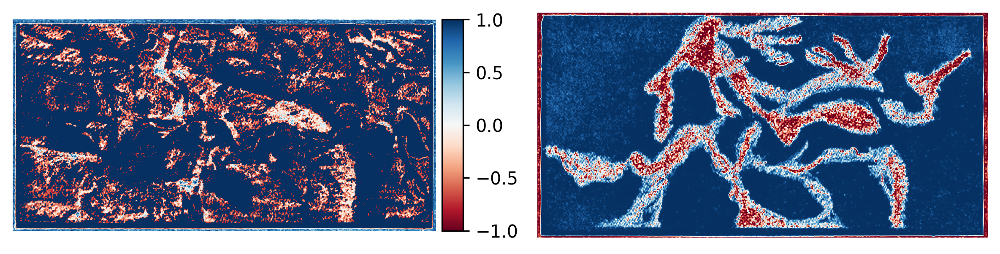

In [94]:
plt.figure(figsize=(8, 4), dpi=300)

cmap = 'RdBu'

plt.subplot(121)
mask = im_sum < 1.8
masked_image = im_sum * mask
inverted_img = util.invert(masked_image)
plt.axis('off')
imshow(inverted_img, cmap=cmap)

plt.subplot(122)
plt.axis('off')
imshow(im[4], cmap=cmap)

### Weight Gradient Maps

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:4009: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


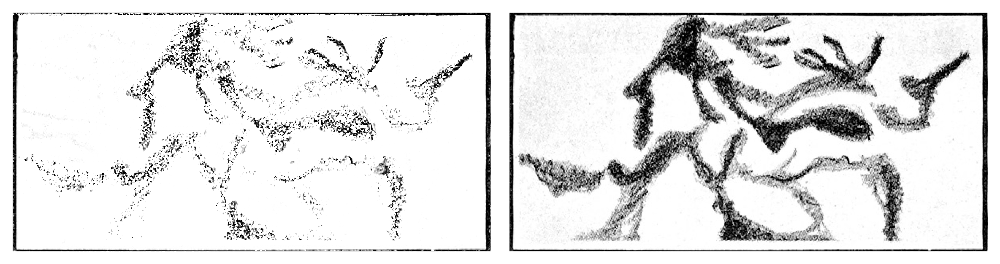

In [95]:
# The 'filter by hands': the weight gradient
plt.figure(figsize=(8, 4), dpi=300)

plt.subplot(121)
im_reasoned = im[4]/im[3]
plt.axis('off')
imshow(im_reasoned)

plt.subplot(122)
plt.axis('off')
imshow(im[4])

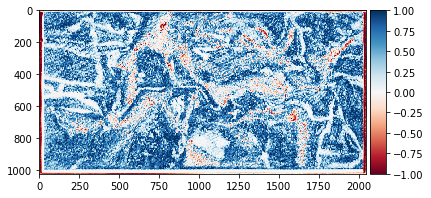

In [96]:
# The 'filter by hands': the weight gradient
im_diff_original = im[4]-im[3]
imshow(im_diff_original)

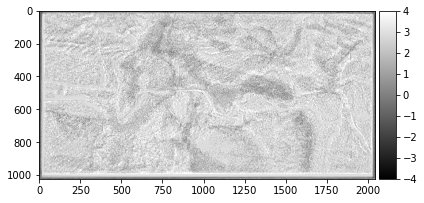

In [97]:
# if apply that filter to the digital overlap
im_diff_proposal = im_sum+im_diff_original
imshow(im_diff_proposal, cmap='gray')